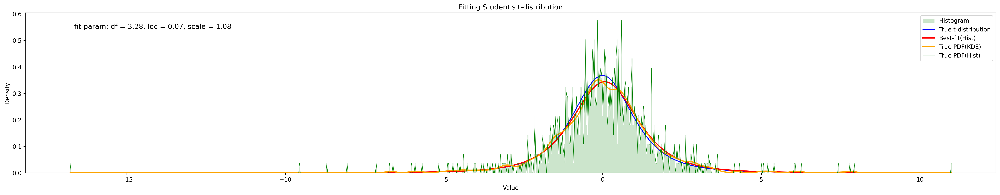

In [1]:
import numpy as np
import pandas as pd
import os
import time
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy.stats import t, norm
from scipy.optimize import curve_fit
from scipy.stats import gaussian_kde

def analysis_demo():
    # as degree of freedom df increase: Cauchy pdf(df=1) -> student-t pdf -> normal distribution(df=inf)
    # Generate some sample data from a t-distribution
    np.random.seed(int(time.time()))
    data = t.rvs(df=3, size=1000)

    HIST_BIN = 1000
    KDE_BW = 0.1
    #   Estimate the PDF using
    #       1. Kernel Density Estimation(KDE) (can smooth, or even over-oscillate(worse than over-fit))
    #       2. histogram-based method
    kde = gaussian_kde(data, bw_method=KDE_BW)  # less bandwidth == more fitting (default is 'scott')
    pdf_values_kde = kde(data)

    hist, bins = np.histogram(data, bins=HIST_BIN, density=True) # density = output pdf or number in each bin
    bin_centers = (bins[:-1] + bins[1:]) / 2
    pdf_values_hist = np.interp(data, bin_centers, hist)

    # PDF (probability density function) of a t-distribution
    def t_pdf(x, df, loc, scale): # samples(x) -> pdf(y) at x
        return t.pdf(x, df, loc=loc, scale=scale)

    # Fit the sample data to the function
    params, cov = curve_fit(t_pdf, 
                            data, 
                            pdf_values_kde, 
                            p0=[1, np.mean(data), np.std(data)], # initial guess
                            method='lm' # Levenberg–Marquardt algorithm (damped least-squares (DLS)) 
                            )

    plt.figure(figsize=(30, 5), dpi=300)  # Adjust the figure size as needed

    # Plot the histogram of the data
    plt.hist(data, bins=HIST_BIN, density=True, alpha=0.2, color='g', label='Histogram')

    x = bin_centers
    plt.plot(x, t_pdf(x, df=3, loc=0, scale=1), color='blue', linestyle='-', label='True t-distribution')
    plt.plot(x, t_pdf(x, *params), color='red', linestyle='-', linewidth=2, label='Best-fit(Hist)')
    plt.plot(x, kde(x), color='orange', linestyle='-', linewidth=2, label='True PDF(KDE)')
    plt.plot(x, hist, color='green', linestyle='-', linewidth=0.5, label='True PDF(Hist)')

    fit_params_str = f"fit param: df = {params[0]:.2f}, loc = {params[1]:.2f}, scale = {params[2]:.2f}"
    plt.text(0.05, 0.9, fit_params_str, transform=plt.gca().transAxes, fontsize=12)

    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.title('Fitting Student\'s t-distribution')
    plt.legend()
    plt.show()

analysis_demo()

In [31]:
from _2_csv_data_parse import get_exchange

# path========================================================================================
assets_list = [
    1,  1698,   '1st-Brd(SH)',      'red',      '1沪A_不包括科创板',
    1,  1505,   '1st-Brd(SZ)',      'orange',   '2深A_不包括创业板',
    1,  569 ,   '2nd-Brd(SH)',      'blue',     '3科创板',
    1,  1338,   '2nd-Brd(SZ)',      'green',    '4创业板',
    1,  244 ,   '3rd-Brd(BJ)',      'purple',   '5北A_新老三板',
    0,  0   ,   'stk idx opt(SH)',  'black',    '6上证股指期权',
    0,  0   ,   'stk idx opt(SZ)',  'gray',     '7深证股指期权',
]
def assets_column(column_num):
    enable = [assets_list[i] for i in range(0, len(assets_list), 5)]
    column = [assets_list[i] for i in range(column_num, len(assets_list), 5)]
    return [item for item, flag in zip(column, enable) if flag == 1]

modpath = os.getcwd()
csv_path = f'{modpath}/../data/'
log = f'{modpath}/logfile.txt'
assets_path_list = [csv_path + asset for asset in assets_column(4)]
def parse_csv_metadata():
    HIST_BIN = 300
    HIST_RANGE = (3,97)
    YEAR = (2015,2023)
    years = YEAR[1] - YEAR[0] + 1
    fig, axs = plt.subplots(2, 1, figsize=(30, 20), dpi=300)
    
    for num, assets_path in enumerate(assets_path_list):
        missing_data_symbols = []
        during_day_return = [[] for _ in range(years)]
        over_night_return = [[] for _ in range(years)]
        stall_days = [0 for _ in range(years)]
        stall_nights = [0 for _ in range(years)]
        assets = assets_path.split('/')[-1]
        for asset_csv_name in tqdm(os.listdir(assets_path), desc=f'{assets}'):
            if asset_csv_name.endswith('.txt'):
                asset_csv_path = os.path.join(assets_path, asset_csv_name)
                num_lines = sum(1 for _ in open(asset_csv_path, encoding='gbk'))
                if(num_lines<10):
                    header = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', nrows=0).columns.tolist()
                    missing_data_symbols.append(header[1])
                    continue
                info_lines_num = [0, 2, num_lines - 2]  # 1st, 3rd, the 2nd_last line
                info_lines = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', skiprows=lambda x: x not in info_lines_num, header=None)
                data_lines_num = range(2,num_lines-1)
                data_lines = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', skiprows=lambda x: x not in data_lines_num, header=None)
                valid_data_acquired = 0
                stall_cnt = 0
                non_stall_cnt = 0
                for i in range(len(data_lines)):
                    data_line = data_lines.iloc[i, 0].split(',')
                    year = int(data_line[0].split('/')[0])
                    if year not in range(YEAR[0], YEAR[1]+1):
                        continue
                    ith_year = year - YEAR[0]
                    day_close = float(data_line[4])
                    day_open = float(data_line[1])
                    if day_open != 0:
                        if day_close == day_open:
                            # print(info_lines.iloc[0, 1], info_lines.iloc[0, 0], data_line) 
                            stall_days[ith_year] += 1
                            # stall_cnt += 1
                            # continue
                        ret = round(day_close/day_open , 5)
                        during_day_return[ith_year].append(ret)
                        # non_stall_cnt += 1
                    if valid_data_acquired and last_close != 0:
                        if day_open == last_close:
                            stall_nights[ith_year] += 1
                            # continue
                        ret = round(day_open/last_close , 5)
                        over_night_return[ith_year].append(ret)
                    last_close = day_close
                    valid_data_acquired = 1
                    # open = data_lines.iloc[i, 0].split(',')[1]
                    # close = data_lines.iloc[i, 0].split(',')[4]
                    # asset_csv_name.split('.')[0],   # 'asset_file_name'
                    # lines.iloc[0, 0],               # 'code'
                    # get_exchange(lines.iloc[0, 0]), # 'exchange'
                    # lines.iloc[0, 1],               # 'symbol'
                    # lines.iloc[1, 0].split(',')[0], # 'start_date'
                    # lines.iloc[-1, 0].split(',')[0],# 'end_date'
                # if non_stall_cnt != 0 or stall_cnt != 0:
                #     stall_rate = round(stall_cnt/(non_stall_cnt+stall_cnt)*100 , 2)
                #     if stall_rate > 20:
                #         print(info_lines.iloc[0, 1], info_lines.iloc[0, 0], stall_rate)

        print('missing_data: ', missing_data_symbols)
        
        for year in range(years):
            data = during_day_return[year]
            if len(data) < 10000:
                continue
            hist_range=(np.percentile(data, HIST_RANGE[0]), np.percentile(data, HIST_RANGE[1]))
            hist, bins = np.histogram(data, range=hist_range, bins=HIST_BIN) # density cannot be used here
            hist_pdf = [h / sum(hist) for h in hist]
            bin_centers = (bins[:-1] + bins[1:]) / 2
            axs[0].plot(bin_centers, hist_pdf, linestyle='-', linewidth=2, color=assets_column(3)[num], alpha=(year/years)**4,
                        label=f'Prob({assets_column(2)[num]})({year+YEAR[0]}:{len(data)}pts), mean:{np.mean(data):.3f}, stall%:{round(stall_days[year]/(len(data)+stall_days[year])*100 , 2)}')

        for year in range(years):
            data = over_night_return[year]
            if len(data) < 10000:
                continue
            hist_range=(np.percentile(data, HIST_RANGE[0]), np.percentile(data, HIST_RANGE[1]))
            hist, bins = np.histogram(data, range=hist_range, bins=HIST_BIN) # density cannot be used here
            hist_pdf = [h / sum(hist) for h in hist]
            bin_centers = (bins[:-1] + bins[1:]) / 2
            axs[1].plot(bin_centers, hist_pdf, linestyle='-', linewidth=2, color=assets_column(3)[num], alpha=(year/years)**4,
                        label=f'Prob({assets_column(2)[num]})({year+YEAR[0]}:{len(data)}pts), mean:{np.mean(data):.3f}, stall%:{round(stall_nights[year]/(len(data)+stall_nights[year])*100 , 2)}')

    axs[0].set_title('Day_Return (yearly)')
    axs[1].set_title('Over_Night_Return (yearly)')
    for ax in axs:
        ax.set_xlabel('Value')
        ax.set_ylabel('Density')
        ax.legend(fontsize=10)
        ax.set_ylim(0, 0.02)

    plt.tight_layout()
    plt.show()
parse_csv_metadata()

1沪A_不包括科创板: 100%|██████████| 1698/1698 [00:57<00:00, 29.49it/s]


missing_data:  ['龙旗科技', '浙江国祥']


2深A_不包括创业板: 100%|██████████| 1505/1505 [00:52<00:00, 28.45it/s]


missing_data:  []


3科创板: 100%|██████████| 569/569 [00:04<00:00, 116.92it/s]


missing_data:  ['C华微', 'C合晶']


4创业板: 100%|██████████| 1338/1338 [00:23<00:00, 56.46it/s]


missing_data:  ['华阳智能', '肯特股份', 'C诺瓦']


5北A_新老三板: 100%|██████████| 244/244 [00:02<00:00, 110.24it/s]


missing_data:  ['海昇药业']


In [62]:
import math
from _2_csv_data_parse import get_exchange
from matplotlib.font_manager import FontProperties
font = FontProperties(fname=r'../misc/simhei.ttf', size=10)
# path========================================================================================
assets_list = [
    1,  1698,   '1st-Brd(SH)',      'red',      '1沪A_不包括科创板',
    1,  1505,   '1st-Brd(SZ)',      'orange',   '2深A_不包括创业板',
    1,  569 ,   '2nd-Brd(SH)',      'blue',     '3科创板',
    1,  1338,   '2nd-Brd(SZ)',      'green',    '4创业板',
    1,  244 ,   '3rd-Brd(BJ)',      'purple',   '5北A_新老三板',
    0,  0   ,   'stk idx opt(SH)',  'black',    '6上证股指期权',
    0,  0   ,   'stk idx opt(SZ)',  'gray',     '7深证股指期权',
]
def assets_column(column_num):
    enable = [assets_list[i] for i in range(0, len(assets_list), 5)]
    column = [assets_list[i] for i in range(column_num, len(assets_list), 5)]
    return [item for item, flag in zip(column, enable) if flag == 1]

modpath = os.getcwd()
csv_path = f'{modpath}/../data/'
log = f'{modpath}/logfile.txt'
assets_path_list = [csv_path + asset for asset in assets_column(4)]
def parse_csv_metadata():
    HIST_BIN = 100
    HIST_RANGE = (3,97)
    YEAR = (2020,2023)
    YEAR_BIN = 4
    years = math.floor((YEAR[1] - YEAR[0]) / YEAR_BIN) + 1
    fig, axs = plt.subplots(2, 1, figsize=(30, 20), dpi=300)

    # sector_code, sector_symbol, stk_code, stk_symbol
    sector_path = os.path.join(csv_path, '行业板块.txt')
    sector_lines = pd.read_csv(sector_path, encoding='gbk', sep=',', header=None)
    sector_codes = []
    sector_names = []
    sector_dict = {}
    for i in range(sector_lines.shape[0]):
        sector_code = sector_lines.iloc[i,0]
        sector_name = sector_lines.iloc[i,1]
        if sector_code not in sector_codes:
            sector_codes.append(sector_code)
            sector_names.append(sector_name)
        sector_dict[sector_lines.iloc[i,2]] = [
            len(sector_codes)-1,      # sector num
            sector_lines.iloc[i,0], # sector code
            sector_lines.iloc[i,1], # sector symbol
            sector_lines.iloc[i,3], # stk symbol
            ]
    number_sectors = len(sector_codes)
    # 552: [1, 880301, '煤炭', '甘肃能化']

    during_day_return = [[[] for _ in range(number_sectors)] for _ in range(years)]
    over_night_return = [[[] for _ in range(number_sectors)] for _ in range(years)]
    for num, assets_path in enumerate(assets_path_list):
        assets = assets_path.split('/')[-1]
        for asset_csv_name in tqdm(os.listdir(assets_path), desc=f'{assets}'):
            if asset_csv_name.endswith('.txt'):
                asset_csv_path = os.path.join(assets_path, asset_csv_name)
                num_lines = sum(1 for _ in open(asset_csv_path, encoding='gbk'))
                if(num_lines<10):
                    header = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', nrows=0).columns.tolist()
                    continue
                info_lines_num = [0, 2, num_lines - 2]  # 1st, 3rd, the 2nd_last line
                info_lines = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', skiprows=lambda x: x not in info_lines_num, header=None)
                data_lines_num = range(2,num_lines-1)
                data_lines = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', skiprows=lambda x: x not in data_lines_num, header=None)
                stk_code = int(info_lines.iloc[0, 0])
                if stk_code not in sector_dict:
                    print('missing sector def: ',stk_code, info_lines.iloc[0, 1])
                    continue
                ith_sector = sector_dict[stk_code][0]
                valid_data_acquired = 0
                for i in range(len(data_lines)):
                    data_line = data_lines.iloc[i, 0].split(',')
                    year = int(data_line[0].split('/')[0])
                    if year not in range(YEAR[0], YEAR[1]+1):
                        continue
                    ith_year = math.floor((year - YEAR[0]) / YEAR_BIN)
                    day_close = float(data_line[4])
                    day_open = float(data_line[1])
                    if day_open != 0:
                        ret = round(day_close/day_open , 5)
                        during_day_return[ith_year][ith_sector].append(ret)
                    if valid_data_acquired and last_close != 0:
                        ret = round(day_open/last_close , 5)
                        over_night_return[ith_year][ith_sector].append(ret)
                    last_close = day_close
                    valid_data_acquired = 1

    for sector in range(number_sectors):
        for year in range(years):
            data = during_day_return[year][sector]
            if len(data) < 1000:
                continue
            hist_range=(np.percentile(data, HIST_RANGE[0]), np.percentile(data, HIST_RANGE[1]))
            hist, bins = np.histogram(data, range=hist_range, bins=HIST_BIN) # density cannot be used here
            hist_pdf = [h / sum(hist) for h in hist]
            bin_centers = (bins[:-1] + bins[1:]) / 2
            axs[0].plot(bin_centers, hist_pdf, linestyle='-', color=plt.cm.viridis(sector/(number_sectors-1)), linewidth=2, alpha=((year+1)/years)**4,
                        label=f'Prob({sector_names[sector]})({YEAR[0]+year*YEAR_BIN}~{YEAR[0]+(year+1)*YEAR_BIN-1}:{len(data)}pts), mean:{np.mean(data):.3f}')

    for sector in range(number_sectors):
        for year in range(years):
            data = over_night_return[year][sector]
            if len(data) < 1000:
                continue
            hist_range=(np.percentile(data, HIST_RANGE[0]), np.percentile(data, HIST_RANGE[1]))
            hist, bins = np.histogram(data, range=hist_range, bins=HIST_BIN) # density cannot be used here
            hist_pdf = [h / sum(hist) for h in hist]
            bin_centers = (bins[:-1] + bins[1:]) / 2
            axs[1].plot(bin_centers, hist_pdf, linestyle='-', color=plt.cm.viridis(sector/(number_sectors-1)), linewidth=2, alpha=((year+1)/years)**4,
                        label=f'Prob({sector_names[sector]})({YEAR[0]+year*YEAR_BIN}~{YEAR[0]+(year+1)*YEAR_BIN-1}:{len(data)}pts), mean:{np.mean(data):.3f}')

    axs[0].set_title('Day_Return_by_Sector (yearly)')
    axs[1].set_title('Over_Night_Return_by_Sector (yearly)')
    for ax in axs:
        ax.set_xlabel('Value')
        ax.set_ylabel('Density')
        ax.legend(fontsize=10, ncol=3, prop=font)
        ax.set_ylim(0, 0.05)

    plt.tight_layout()
    plt.show()
parse_csv_metadata()

5北A_新老三板: 100%|██████████| 244/244 [00:02<00:00, 113.99it/s]


In [28]:

from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import adfuller as ADF
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import arch

lags = 10

def teststeady(data,count=0,print_test=1):
    res_ADF = ADF(data) # q-statistic p-value
    if print_test:
        pass
        # print('Augmented Dickey-Fuller test: ')
    Pv = res_ADF[1]
    if Pv > 0.05:
        print('\033[1;31m    P-value:%s，unstable, use rootsquare\033[0m' % round(Pv,5))
        count = count + 1
        print('\033[1;32m    after %s square-root: \033[0m' % count)
        data = data.diff(1).dropna()
        teststeady(data,count,0)
    else:
        pass
        # print('\033[1;34m    P-value:%s , stable, continue model \033[0m'% round(Pv,5))
    return data

def testwhitenoise(data):
    acf,q,p = sm.tsa.acf(data,nlags=lags,qstat=True)
    out = np.c_[range(1,lags+1),acf[1:],q,p]
    output = pd.DataFrame(out,columns=['lag','autocorrelation','q_statistics','p_values'])
    output = output.set_index('lag')
    # print(output)

def confirm_p(data):
    fig = plt.figure(figsize=(10,6))
    train = teststeady(data)
    ax1 = fig.add_subplot(111)
    fig = plot_pacf(train, lags=lags, ax=ax1)
    plt.show() 

def testARCH(data):
    data = np.array(data)
    teststeady(data)
    tempmodel = ARIMA(endog=data, exog=None, order=(lags,0,0)).fit() # AR(10) model
    at = [data[i] - value for i, value in enumerate(tempmodel.fittedvalues)]
    at2 = np.power(at,2) # residue square
    testwhitenoise(at2)
    # confirm_p(at2)

# print("Durbin-Watson Test(autocorrelation): ", dw_test, " null hypothesis:(DW = 2)")
# print("White's Test(Heteroskedasticity): ", white_test[1], " null hypothesis:(p is small)")
# # Joint significance test (F-test)
# print("F-statistic:", results.fvalue)
# print("F-test p-value:", results.f_pvalue)
# print("F-test null hypothesis: All independent variables are jointly insignificant (i.e., all coefficients are zero)")

In [ ]:
'''
chrome-extension://oemmndcbldboiebfnladdacbdfmadadm/http://efinance.org.cn/cn/FEshuo/TS4_Updated2.pdf

分布的不同阶矩: Mean(均值), Variance(方差), Skewness(偏度), Kurtosis(峰度)
普通的AR(自回归)MA(均值)(线性/常数方差) 模型对收益率分布预测效果很差：
    1. 收益率分布呈现尖峰肥尾特征(没有高阶矩)
    2. 收益率分布波动率聚类(市场对冲击的反应不是瞬时的)(没有动态方差)
普通的GARCH model不能反应(正负面消息)非对称波动率杠杆效应(e.g. 需要EGARCH)

Tests for Heteroscedasticity: (variance of residuals changes over time)
    1. Breusch-Pagan test
    2. White test
    3. Goldfeld-Quandt test
Tests for Autocorrelation: (systematic relationship between current and past observations)
    1. Ljung-Box test
    2. Durbin-Watson test

test pass = no significant autocorrelation = may not need ARCH/GARCH

AR(p) model:        Xₜ =        c + φ₁Xₜ₋₁ + φ₂Xₜ₋₂ + ... + φₚXₜ₋p + εₜ
ARMA(p,q) model:    Xₜ =        c + φ₁Xₜ₋₁ + φ₂Xₜ₋₂ + ... + φₚXₜ₋p + 
                                θ₁εₜ₋₁ + θ₂εₜ₋₂ + ... + θ_qεₜ₋q + εₜ
ARCH(q) model:      εₜ =        σₜzₜ (Conditional Heteroskedasticity)
                    σₜ² =       α₀ + α₁ε²ₜ₋₁ + α₂ε²ₜ₋₂ + ... + α_qε²ₜ₋q 
                                (past squared errors: volatility clustering)
GARCH(p,q)model:    εₜ =        σₜzₜ
                    σₜ² =       α₀ + ∑ᵢ₌₁' q αᵢε²ₜ₋ᵢ + ∑ⱼ₌₁' p βⱼσ²ₜ₋ⱼ 
                                (past conditional variance: persistence in volatility)
EGARCH model:       log(σₜ²) =  ω + ∑ᵢ₌₁' q αᵢ(|εₜ₋ᵢ| - √(2/π)) + ∑ⱼ₌₁' p βⱼlog(σ²ₜ₋ⱼ)

'''
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from _2_csv_data_parse import get_exchange
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from tqdm import tqdm
import math
from datetime import datetime
import sys, os
font = FontProperties(fname=r'../misc/simhei.ttf', size=10)

def blockPrint():
    sys.stdout = open(os.devnull, 'w')
def enablePrint():
    sys.stdout = sys.__stdout__

# path========================================================================================
assets_list = [
    0,  1698,   '1st-Brd(SH)',      'red',      '1沪A_不包括科创板',
    0,  1505,   '1st-Brd(SZ)',      'orange',   '2深A_不包括创业板',
    0,  569 ,   '2nd-Brd(SH)',      'blue',     '3科创板',
    0,  1338,   '2nd-Brd(SZ)',      'green',    '4创业板',
    1,  244 ,   '3rd-Brd(BJ)',      'purple',   '5北A_新老三板',
    0,  0   ,   'stk idx opt(SH)',  'black',    '6上证股指期权',
    0,  0   ,   'stk idx opt(SZ)',  'gray',     '7深证股指期权',
]
def assets_column(column_num):
    enable = [assets_list[i] for i in range(0, len(assets_list), 5)]
    column = [assets_list[i] for i in range(column_num, len(assets_list), 5)]
    return [item for item, flag in zip(column, enable) if flag == 1]

modpath = os.getcwd()
csv_path = f'{modpath}/../data/'
log = f'{modpath}/logfile.txt'
assets_path_list = [csv_path + asset for asset in assets_column(4)]
def parse_csv_metadata():
    HIST_BIN = 100
    HIST_RANGE = (3,97)
    YEAR = (2020,2023)
    YEAR_BIN = 4
    m = 10  # Recalculate rolling forecast every m data points
    n = 5   # Forecast the next n points

    start_day = datetime.strptime(f'{str(YEAR[0])}/1/1', '%Y/%m/%d')
    end_day = datetime.strptime(f'{str(YEAR[1])}/12/31', '%Y/%m/%d')
    days = (end_day-start_day).days
    years = math.floor((YEAR[1] - YEAR[0]) / YEAR_BIN) + 1

    # sector_code, sector_symbol, stk_code, stk_symbol
    sector_path = os.path.join(csv_path, '行业板块.txt')
    sector_lines = pd.read_csv(sector_path, encoding='gbk', sep=',', header=None)
    sector_codes = []
    sector_names = []
    sector_dict = {}
    for i in range(sector_lines.shape[0]):
        sector_code = sector_lines.iloc[i,0]
        sector_name = sector_lines.iloc[i,1]
        if sector_code not in sector_codes:
            sector_codes.append(sector_code)
            sector_names.append(sector_name)
        sector_dict[sector_lines.iloc[i,2]] = [
            len(sector_codes)-1,      # sector num
            sector_lines.iloc[i,0], # sector code
            sector_lines.iloc[i,1], # sector symbol
            sector_lines.iloc[i,3], # stk symbol
            ]
    number_sectors = len(sector_codes)
    # 552: [1, 880301, 'sector', 'stk_name']

    during_day_return = [[[] for _ in range(days)] for _ in range(number_sectors)]
    over_night_return = [[[] for _ in range(days)] for _ in range(number_sectors)]
    for assets_path in assets_path_list:
        assets = assets_path.split('/')[-1]
        for asset_csv_name in tqdm(os.listdir(assets_path), desc=f'{assets}'):
            if asset_csv_name.endswith('.txt'):
                asset_csv_path = os.path.join(assets_path, asset_csv_name)
                num_lines = sum(1 for _ in open(asset_csv_path, encoding='gbk'))
                if(num_lines<10):
                    header = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', nrows=0).columns.tolist()
                    continue
                info_lines_num = [0, 2, num_lines - 2]  # 1st, 3rd, the 2nd_last line
                info_lines = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', skiprows=lambda x: x not in info_lines_num, header=None)
                data_lines_num = range(2,num_lines-1)
                data_lines = pd.read_csv(asset_csv_path, encoding='gbk', sep='\s+', skiprows=lambda x: x not in data_lines_num, header=None)
                stk_code = int(info_lines.iloc[0, 0])
                if stk_code not in sector_dict:
                    print('missing sector def: ',stk_code, info_lines.iloc[0, 1])
                    continue
                ith_sector = sector_dict[stk_code][0]
                valid_data_acquired = 0
                for i in range(len(data_lines)):
                    data_line = data_lines.iloc[i, 0].split(',')
                    day = (datetime.strptime(data_line[0], '%Y/%m/%d') - start_day).days
                    year = int(data_line[0].split('/')[0])
                    if year not in range(YEAR[0], YEAR[1]+1):
                        continue
                    day_close = float(data_line[4])
                    day_open = float(data_line[1])
                    if day_open != 0:
                        ret = round(day_close/day_open , 5)
                        during_day_return[ith_sector][day].append(ret)
                    if valid_data_acquired and last_close != 0:
                        ret = round(day_open/last_close , 5)
                        over_night_return[ith_sector][day].append(ret)
                    last_close = day_close
                    valid_data_acquired = 1

    for sector in range(0, number_sectors):
        for day in range(days):
            during_day_return[sector][day] = np.mean(during_day_return[sector][day])
        returns = during_day_return[sector]
        returns = [x for x in returns if not math.isnan(x)]
        if len(returns) < 100:
            continue
        returns = pd.DataFrame(returns)
        returns_rolling_var = returns.rolling(window=2).var() + 1

        print(sector_names[sector])
        
        # Lists to store forecasts
        arima_garch_forecast = []
        garch_forecast = []
        t_garch_forecast = []
        egarch_forecast = []
        plot_range = []
        
        testARCH(returns.values.tolist())
        
        blockPrint()
        from arch.univariate import arch_model
        # Generate rolling forecasts
        for i in range(m, len(returns), m):
            plot_range.append(i)
            
            # ARIMA-GARCH forecast
            mix_arima_model = ARIMA(returns[:i], order=(10, 0, 5))
            mix_arima_results = mix_arima_model.fit()
            mix_arima_fc = mix_arima_results.forecast(steps=n)
            mix_garch_model = arch_model(mix_arima_results.resid, vol='GARCH', p=10, q=5, dist='Normal')
            mix_garch_results = mix_garch_model.fit(update_freq=m)
            mix_garch_fc = mix_garch_results.forecast(horizon=n, method='analytic').mean.iloc[-1].values
            arima_garch_fc = mix_arima_fc.values[0] + mix_garch_fc[0]  # Predicted mean + predicted residual
            arima_garch_forecast.append(arima_garch_fc)
            
            # GARCH forecast
            garch_model = arch_model(returns[:i], vol='GARCH', p=10, q=5, dist='Normal')
            garch_results = garch_model.fit(update_freq=m, disp='off')
            garch_fc = garch_results.forecast(horizon=n, method='analytic').mean.iloc[-1].values
            garch_forecast.extend(garch_fc)
            
            # t-GARCH forecast
            t_garch_model = arch_model(returns[:i], vol='GARCH', p=10, q=5, dist='t')
            t_garch_results = t_garch_model.fit(update_freq=m, disp='off')
            t_garch_fc = t_garch_results.forecast(horizon=n, method='analytic').mean.iloc[-1].values
            t_garch_forecast.extend(t_garch_fc)
            
            # EGARCH forecast
            egarch_model = arch_model(returns[:i], vol='EGARCH', p=10, q=5, dist='t')
            egarch_results = egarch_model.fit(update_freq=m, disp='off')
            egarch_fc = egarch_results.forecast(horizon=n, method='simulation').mean.values[-1]
            egarch_forecast.append(egarch_fc)
        
        plt.figure(figsize=(10, 6),  dpi=300)
        
        # Actual returns
        plt.plot(returns, label='Actual Returns')
        plt.plot(returns_rolling_var, label='Rolling Variance of Actual Returns')
        
        # ARIMA-GARCH predictions
        plt.plot(plot_range, arima_garch_forecast[:len(plot_range)], 
                color=plt.cm.viridis(sector/(number_sectors-1)), alpha=1.0,
                label=f'{sector_names[sector]} ARIMA-GARCH Rolling Prediction')
        
        # GARCH predictions
        plt.plot(plot_range, garch_forecast[:len(plot_range)], 
                color=plt.cm.viridis(sector/(number_sectors-1)), alpha=0.8,
                label=f'{sector_names[sector]} GARCH Rolling Prediction')
        
        # t-GARCH predictions
        plt.plot(plot_range, t_garch_forecast[:len(plot_range)], 
                color=plt.cm.viridis(sector/(number_sectors-1)), alpha=0.6,
                label=f'{sector_names[sector]} t-GARCH Rolling Prediction')
        
        # EGARCH predictions
        plt.plot(plot_range, egarch_forecast, 
                color=plt.cm.viridis(sector/(number_sectors-1)), alpha=0.4,
                label=f'{sector_names[sector]} EGARCH Rolling Prediction')
        
        break
    plt.title('Rolling Predictions for Day_Return_by_Sector')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend(fontsize=10, ncol=3, prop=font)
    plt.ylim(0.6, 1.4)
    plt.tight_layout()
    plt.show()
parse_csv_metadata()

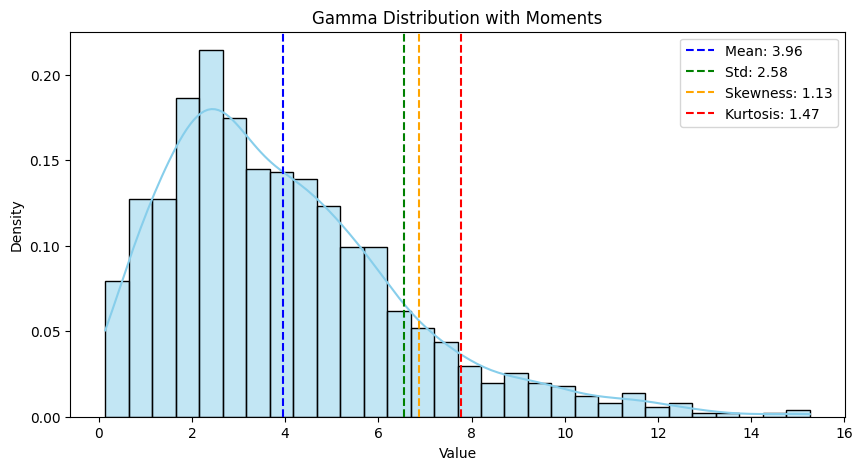

In [2]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

data = np.random.gamma(2.0, 2.0, size=1000)
mean = np.mean(data)
variance = np.var(data)
skewness = stats.skew(data)
kurtosis = stats.kurtosis(data)

plt.figure(figsize=(10, 5))
sns.histplot(data, bins=30, kde=True, color='skyblue', edgecolor='black', stat='density')
plt.axvline(mean, color='blue', linestyle='--', label=f'Mean: {mean:.2f}')
plt.axvline(mean + np.sqrt(variance), color='green', linestyle='--', label=f'Std: {np.sqrt(variance):.2f}')
plt.axvline(mean + skewness * np.sqrt(variance), color='orange', linestyle='--', label=f'Skewness: {skewness:.2f}')
plt.axvline(mean + kurtosis * np.sqrt(variance), color='red', linestyle='--', label=f'Kurtosis: {kurtosis:.2f}')

plt.title('Gamma Distribution with Moments')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()

plt.show()
